In [1]:
import pandas as pd
import gensim.models as g
from scipy import spatial
import numpy as np
import spacy 
import sent2vec
from nltk.corpus import stopwords
import os 
from analytics import operation_builder
from analytics.parser import *
from analytics.visualization import *
import matplotlib.pyplot as plt
import seaborn as sns
import regex as re
from spacy.tokenizer import Tokenizer

In [2]:
Stoplist = set(stopwords.words('english'))
Stoplist.add('<')
Stoplist.add('>')
start_alpha=0.01
infer_epoch=1000
nlp = spacy.load('en_core_web_md')

In [3]:
prefix_re = re.compile(r'''^[\[\("']''')
suffix_re = re.compile(r'''[\]\)"']$''')
infix_re = re.compile(r'''[-~]''')
simple_url_re = re.compile(r'''^https?://''')

def custom_tokenizer(nlp):
    return Tokenizer(nlp.vocab, prefix_search=prefix_re.search,
                                suffix_search=suffix_re.search,
                                infix_finditer=infix_re.finditer,
                                token_match=simple_url_re.match)

In [4]:
model4 = sent2vec.Sent2vecModel()
model_name4 = '../pre_modle/sent2vec/wiki_unigrams.bin'
model4.load_model(model_name4)

In [ ]:
model_name = '../pre_modle/doc2vec/enwiki/doc2vec.bin'
model1 = g.Doc2Vec.load(model_name)
model_name = '../pre_modle/doc2vec/apnews_dbow/doc2vec.bin'
model2 = g.Doc2Vec.load(model_name)
model3 = spacy.load('en_core_web_md')
model4 = sent2vec.Sent2vecModel()
model_name4 = '../pre_modle/sent2vec/wiki_unigrams.bin'
model4.load_model(model_name4)
model5 = sent2vec.Sent2vecModel()
model_name5 = '../pre_modle/sent2vec/torontobooks_unigrams.bin'
model5.load_model(model_name5)

In [5]:
def cleanText(text):
    cleanedText = []
    doc = nlp(text)
    for word in doc:
        if word.text.lower() not in Stoplist and not word.is_punct and not word.like_url and not word.like_num and ('\n' not in word.string):
            cleanedText.append(word.lemma_)
    return cleanedText

In [6]:
def Similarity(text1,text2,model_name):
    
    text1 = cleanText(text1)
    text2 = cleanText(text2)
    if model_name == 'doc2vec-wiki':
        model = model1
        vec1 = model.infer_vector(text1, alpha=start_alpha, steps=infer_epoch)
        vec2 = model.infer_vector(text2, alpha=start_alpha, steps=infer_epoch)
    elif model_name == 'doc2vec-news':
        model = model2
        vec1 = model.infer_vector(text1, alpha=start_alpha, steps=infer_epoch)
        vec2 = model.infer_vector(text2, alpha=start_alpha, steps=infer_epoch)
    elif model_name=='spacy':
        model = model3
        text1 = ' '.join(text1)
        text2 = ' '.join(text2)
        vec1 = model(text1).vector
        vec2 = model(text2).vector
    elif model_name == 'sent2vec-wiki':
        model = model4
        text1 = ' '.join(text1)
        text2 = ' '.join(text2)
        vec1 = model.embed_sentence(text1) 
        vec2 = model.embed_sentence(text2)
        #print(vec1,vec2)
    elif model_name == 'sent2vec-book':
        model = model5
        text1 = ' '.join(text1)
        text2 = ' '.join(text2)
        vec1 = model.embed_sentence(text1) 
        vec2 = model.embed_sentence(text2) 
    
    similarity = 1-spatial.distance.cosine(vec1,vec2)
#     dis = np.linalg.norm(vec1,vec2)
    return similarity

In [7]:
def computeSimilarity(data):
    data['apnews-doc2vec'] = data.apply(lambda row:Similarity(row['text1'],row['text2'],'doc2vec-news'),axis=1)

    data['enwiki-doc2vec'] = data.apply(lambda row:Similarity(row['text1'],row['text2'],'doc2vec-wiki'),axis=1)

    data['spacy_model'] = data.apply(lambda row:Similarity(row['text1'],row['text2'],'spacy'),axis=1)

    data['sent2vec-wiki'] = data.apply(lambda row:Similarity(row['text1'],row['text2'],'sent2vec-wiki'),axis=1)

    data['sent2vec-book'] = data.apply(lambda row:Similarity(row['text1'],row['text2'],'sent2vec-book'),axis=1)
    return data

In [8]:

list_of_elem_ops_per_pad = dict()
elemOpsCounter = 0
root_of_dbs = "../../data/"


for (dirpath, dirnames, filenames) in os.walk(root_of_dbs):
    for filename in filenames:
        
        if '.sql' in filename:
            path_to_db = os.path.join(dirpath, filename)
            # Fetching the new operations
            list_of_elem_ops_per_main = get_elem_ops_per_pad_from_db(
                path_to_db=path_to_db,
                 editor='sql_dump'
            )# we got the ElementOperations of each pad at beginining

            for pad_name, pad_vals in list_of_elem_ops_per_main.items():
                list_of_elem_ops_per_pad[pad_name + filename[-7:-4]] = pad_vals
        
pads, _, elem_ops_treated = operation_builder.build_operations_from_elem_ops(list_of_elem_ops_per_pad,##  pads with all the operations
                                                                             config.maximum_time_between_elem_ops)

In [32]:
filename = '../../data/similar.csv'
similar_data= pd.read_csv(filename,header=0)
similar_data.columns = ['text1','text2']

filename2 = '../../data/medium_similar.csv'
medium_data = pd.read_csv(filename2,header=0)
medium_data.columns = ['text1','text2']

filename3 = '../../data/Non-similar.csv'
Nonsimilar_data = pd.read_csv(filename3,header=0)
Nonsimilar_data.columns = ['text1','text2']


In [10]:
similar_data.is

,text1,text2
0,Throughout this extract of a whole article abo...,In the excerpt from the entire article on red ...
1,Glyphosate is one of the most widely-used wee...,Glyphosate is one of the most widely used herb...
2,studies show that the amount of weedkiller fou...,Studies have shown that the herbicidal doses f...
3,the most extensively used herbicide in the his...,Agriculture in the history of the most widely ...
4,"“As part of the Farm Family Exposure Study, we...","“As part of the Farm Family Exposure Study, we..."
5,"Tom Sanders, head of the nutritional sciences ...","Tom Sanders, head of the Nutrition Research De..."
6,Regarding impacts on the environment by using ...,Regarding the environmental impact of using gl...
7,Risks of taking it\nResearchers don't know whe...,Accept the risk of it\nResearchers don't know ...
8,Overview\nRed yeast rice has been used in Chin...,Overview\nRed yeast rice has been used as a pr...
9,There isn't enough information to see if it fo...,There is not enough information to determine i...


In [11]:
similar_data = computeSimilarity(similar_data)
medium_data = computeSimilarity(medium_data)
Nonsimilar_data = computeSimilarity(Nonsimilar_data)

In [12]:
similar_data

,text1,text2,apnews-doc2vec,enwiki-doc2vec,spacy_model,sent2vec-wiki,sent2vec-book
0,Throughout this extract of a whole article abo...,In the excerpt from the entire article on red ...,0.724411,0.790809,0.988896,0.944301,0.930452
1,Glyphosate is one of the most widely-used wee...,Glyphosate is one of the most widely used herb...,0.769475,0.826998,0.992058,0.960587,0.954380
2,studies show that the amount of weedkiller fou...,Studies have shown that the herbicidal doses f...,0.650307,0.759714,0.987014,0.905906,0.870153
3,the most extensively used herbicide in the his...,Agriculture in the history of the most widely ...,0.699505,0.732281,0.990347,0.960552,0.942127
4,"“As part of the Farm Family Exposure Study, we...","“As part of the Farm Family Exposure Study, we...",0.812416,0.806997,0.994636,0.980751,0.971601
5,"Tom Sanders, head of the nutritional sciences ...","Tom Sanders, head of the Nutrition Research De...",0.869285,0.895900,0.993393,0.917839,0.908071
6,Regarding impacts on the environment by using ...,Regarding the environmental impact of using gl...,0.799799,0.841022,0.995101,0.969355,0.956887
7,Risks of taking it\nResearchers don't know whe...,Accept the risk of it\nResearchers don't know ...,0.876914,0.906877,0.996398,0.976317,0.973562
8,Overview\nRed yeast rice has been used in Chin...,Overview\nRed yeast rice has been used as a pr...,0.867508,0.888431,0.996980,0.978264,0.978794
9,There isn't enough information to see if it fo...,There is not enough information to determine i...,0.916183,0.889005,0.995423,0.961812,0.968529


In [22]:
data = pd.concat([similar_data,medium_data,Nonsimilar_data])
data.reset_index(inplace=True)
data.drop(columns=['index'],inplace=True)

In [24]:
data

,text1,text2,apnews-doc2vec,enwiki-doc2vec,spacy_model,sent2vec-wiki,sent2vec-book
0,Throughout this extract of a whole article abo...,In the excerpt from the entire article on red ...,0.724411,0.790809,0.988896,0.944301,0.930452
1,Glyphosate is one of the most widely-used wee...,Glyphosate is one of the most widely used herb...,0.769475,0.826998,0.992058,0.960587,0.954380
2,studies show that the amount of weedkiller fou...,Studies have shown that the herbicidal doses f...,0.650307,0.759714,0.987014,0.905906,0.870153
3,the most extensively used herbicide in the his...,Agriculture in the history of the most widely ...,0.699505,0.732281,0.990347,0.960552,0.942127
4,"“As part of the Farm Family Exposure Study, we...","“As part of the Farm Family Exposure Study, we...",0.812416,0.806997,0.994636,0.980751,0.971601
5,"Tom Sanders, head of the nutritional sciences ...","Tom Sanders, head of the Nutrition Research De...",0.869285,0.895900,0.993393,0.917839,0.908071
6,Regarding impacts on the environment by using ...,Regarding the environmental impact of using gl...,0.799799,0.841022,0.995101,0.969355,0.956887
7,Risks of taking it\nResearchers don't know whe...,Accept the risk of it\nResearchers don't know ...,0.876914,0.906877,0.996398,0.976317,0.973562
8,Overview\nRed yeast rice has been used in Chin...,Overview\nRed yeast rice has been used as a pr...,0.867508,0.888431,0.996980,0.978264,0.978794
9,There isn't enough information to see if it fo...,There is not enough information to determine i...,0.916183,0.889005,0.995423,0.961812,0.968529


Text(0, 0.5, 'Similarity')

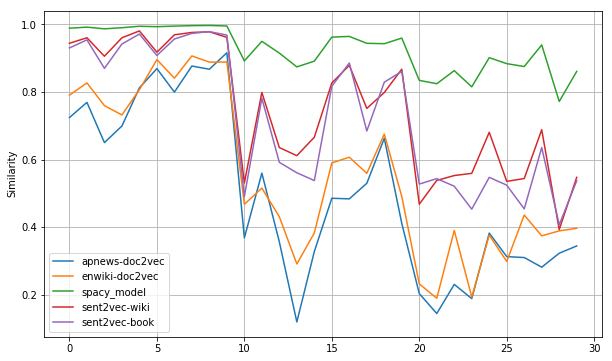

In [27]:
ydata= list(data.columns)[2:]
ax = data.plot(y=ydata, kind="line",figsize=(10,6),grid=True)
ax.set_ylabel("Similarity")

In [ ]:
ydata= list(similar_data.columns)[2:]

ax = similar_data.plot(y=ydata, kind="line",figsize=(10,6))
ax.plot()
ax.set_ylabel("Similarity")
ax.set_xlabel("Most similar data")

ydata= list(medium_data.columns)[2:]

ax = medium_data.plot(y=ydata, kind="line",figsize=(10,6))
ax.set_ylabel("Similarity")
ax.set_xlabel("Medium similar data")

ydata= list(Nonsimilar_data.columns)[2:]

ax = Nonsimilar_data.plot(y=ydata, kind="line",figsize=(10,6))
ax.set_ylabel("Similarity")
ax.set_xlabel("Non-similar data")

# Conclusion
1. As we can see from the result of each models for different similarity paragraph texts. `doc2vec` model can clearly recognise different similarity paragraph texts, but it has lower values even the the paragraph looks very similar. As for `spacy` model, we can also recognice different similarity paragraph texts, but the values of them are always very high even the two texts are totally different. And `sent2vec` model can correctly recognice them but the values of totally different texts are also not low.

2. And then we can discover the different performances of those models when applying to same paragraph pair. `Spacy` model always have the higest values and `doc2vec` always have the lowest values.  Overall, for each two paragraph pairs, the difference(- or +) between these two pais are almost the same. However, `doc2vec` have Opposite trend when compared with `spacy` and `sent2vec`.

In [9]:
pad_name = list(pads.keys())[11]
pad = pads[pad_name]
num_para = len(pad.get_paragraphs_text())
for pt in pad.get_paragraphs_text():
    print(pt)
    print()
    print()

Your task is to act as an advisor to an official within the science  ministry. You are advising an official on the issues below. 
The official  is not an expert in the area, but you can assume they are a generally  informed reader. 
They are interested in the best supported claims in the  documents. Produce a summary of the best supported claims you find and explain why you think they are. 
Note you are not being asked to "create your own argument" or  "summarise everything you find" but rather, make a judgement about which  claims have the strongest support.


INTRODUCTION :
Glyphosate  is the active ingredient in Roundup agricultural herbicides and other  herbicide formulations that are widely used for agricultural, forestry,  and residential weed control.
It is one of the most widely-used weedkillers in the  world, used by farmers, local government and gardeners, as well as  sprayed
extensively on some genetically modified crops imported into  Europe for use as animal feed.
Glyphosa

In [10]:
def computeSimilarityMatrix(pad,size):
    superparagraph_list = pad.get_paragraphs_text()
    length = len(superparagraph_list)
    similar_matrix =np.zeros([size,size])
    for i in range(size):
        for j in range(i,size):
            if i <length and j<length:
                text1 = superparagraph_list[i]
                text2 = superparagraph_list[j]
                similar = Similarity(text1,text2,'sent2vec-wiki')
                similar_matrix[i][j] = similar
                similar_matrix[j][i] = similar
            else:
                similar_matrix[i][j] = 0
                similar_matrix[j][i] = 0
    return similar_matrix

def plotSimilarityHeatmap(matrix):
    fig, ax = plt.subplots(figsize=(10,7))
    sns.heatmap(matrix,ax=ax,linewidth=0.5)

    ax.set_xlabel('SuperParagraph ID')
    ax.set_ylabel('SuperParagraph ID')
    plt.show()

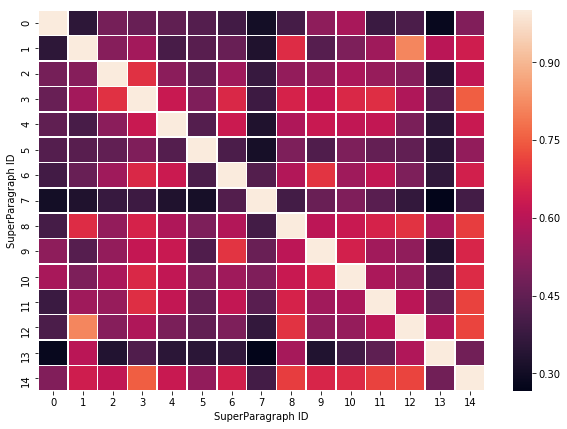

In [99]:
matrix = computeSimilarityMatrix(pad,num_para)
plotSimilarityHeatmap(matrix)

In [12]:
time_interval = 180000
pad.create_paragraphs_from_ops(elem_ops_treated[pad_name])
pad.BuildWindowOperation(time_interval)

In [13]:
start_times = {pad_name: pad.get_timestamps()[0] for pad_name, pad in pads.items()}
pad_name = list(pads.keys())[13]
new_pads  = []
for i in range(1,len(pad.window_operation.keys())+1):
    window_length = time_interval * i
    new_pad, new_elem_ops = pad.pad_at_timestamp(start_times[pad_name] + window_length)
    new_pads.append(new_pad)

In [14]:
num_pads =len(new_pads)
num_pads

16

In [15]:
times_similaity_matrix = np.zeros([len(new_pads),num_para,num_para])
times_similaity_matrix.shape

(16, 15, 15)

In [16]:
for i in range(len(new_pads)):
    print(i)
    times_similaity_matrix[i] = computeSimilarityMatrix(new_pads[i],num_para)
np.nan_to_num(times_similaity_matrix)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15


array([[[1.        , 0.2838406 , 0.4806875 , ..., 0.        ,
         0.        , 0.        ],
        [0.2838406 , 1.        , 0.55032998, ..., 0.        ,
         0.        , 0.        ],
        [0.4806875 , 0.55032998, 1.        , ..., 0.        ,
         0.        , 0.        ],
        ...,
        [0.        , 0.        , 0.        , ..., 0.        ,
         0.        , 0.        ],
        [0.        , 0.        , 0.        , ..., 0.        ,
         0.        , 0.        ],
        [0.        , 0.        , 0.        , ..., 0.        ,
         0.        , 0.        ]],

       [[1.        , 0.2838406 , 0.4806875 , ..., 0.        ,
         0.        , 0.        ],
        [0.2838406 , 1.        , 0.55032998, ..., 0.        ,
         0.        , 0.        ],
        [0.4806875 , 0.55032998, 1.        , ..., 0.        ,
         0.        , 0.        ],
        ...,
        [0.        , 0.        , 0.        , ..., 0.        ,
         0.        , 0.        ],
        [0. 

In [29]:
plt.rcParams.update({'font.size': 18})

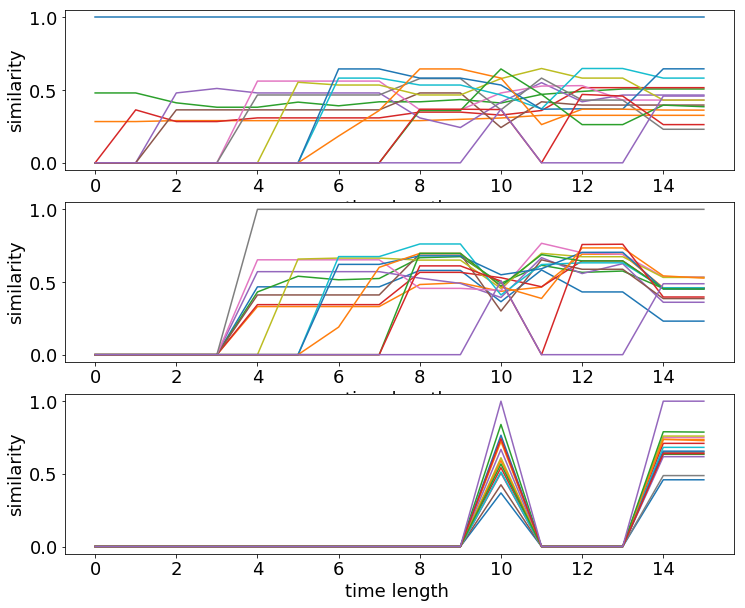

In [27]:
fig, axs = plt.subplots(3, 1, figsize=(12, 10))
for i in range(3):
    ax = axs[i]
    for para in range(num_para):
        ax.plot(times_similaity_matrix[:,7*i,para])
        ax.set_ylabel('similarity')
        ax.set_xlabel('time length ')
plt.show()

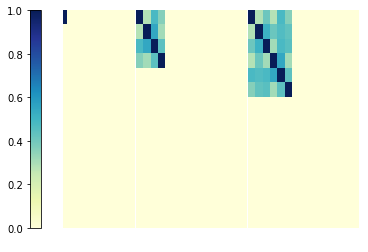

In [136]:
fig, (ax,ax2,ax3) = plt.subplots(ncols=3)
fig.subplots_adjust(wspace=0.01)
sns.heatmap(times_similaity_matrix[0], cmap="YlGnBu", ax=ax, cbar=False)
fig.colorbar(ax.collections[0], ax=ax,location="left", use_gridspec=False, pad=0.2)
ax.set_axis_off()

sns.heatmap(times_similaity_matrix[1], cmap="YlGnBu", ax=ax2, cbar=False)
ax2.set_axis_off()


sns.heatmap(times_similaity_matrix[2], cmap="YlGnBu", ax=ax3, cbar=False)
ax3.set_axis_off()



plt.show()

/home/eric/.local/lib/python3.6/site-packages/scipy/spatial/distance.py:698: RuntimeWarning: invalid value encountered in float_scalars
  dist = 1.0 - uv / np.sqrt(uu * vv)
/home/eric/.local/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


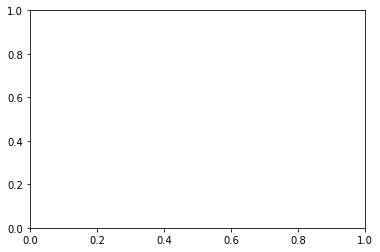

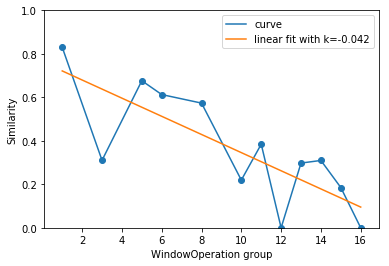

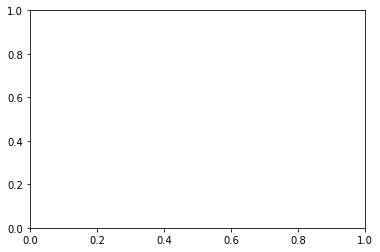

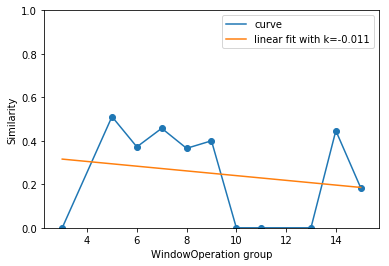

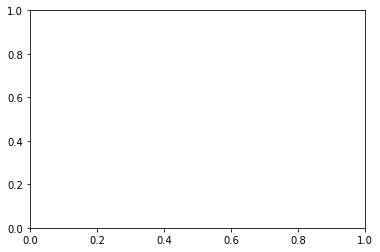

...

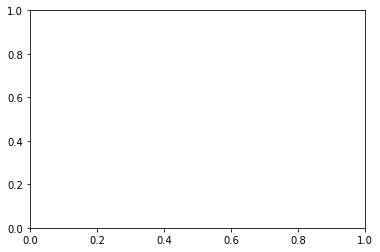

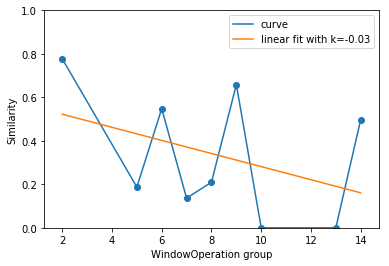

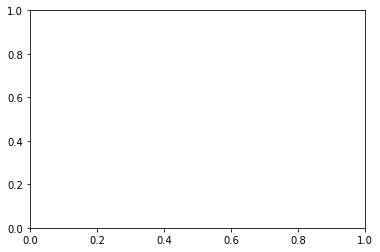

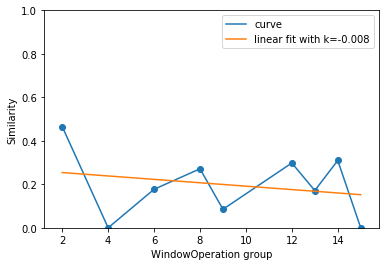

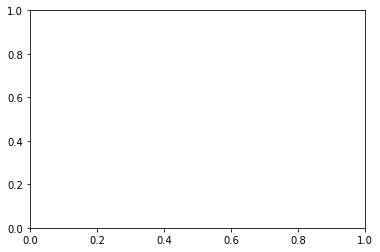

In [9]:
pad_slope = {}
time_interval = 180000
for pad_name in pads.keys():
    pad = pads[pad_name]
    pad.create_paragraphs_from_ops(elem_ops_treated[pad_name])
    pad.BuildWindowOperation(time_interval)
    pad.getTextByWin(True,model4) 
    pad.computeDistance()
    pad.PlotSimilarityDistribution(False)
    pad_slope[pad_name] = pad.fitting_slope

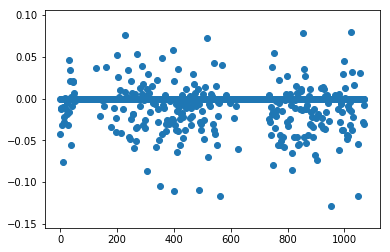

In [10]:
x = [i for i in range(len(pad_slope.keys()))]
y = list(pad_slope.values())
plt.scatter(x,list(pad_slope.values()))
plt.show()

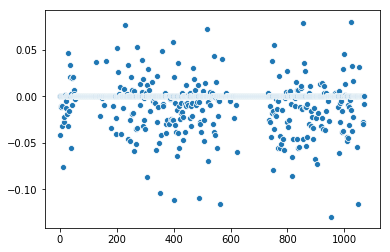

In [11]:
sns.scatterplot(x,list(pad_slope.values()))

In [12]:
z = np.array(y)

In [13]:
z = z[z!=0]

In [14]:
z

array([-0.042, -0.011, -0.012, -0.032, -0.01 , -0.076, -0.028, -0.022,
        0.001, -0.013, -0.005, -0.019, -0.032,  0.046, -0.016,  0.034,
        0.021, -0.055,  0.002, -0.009,  0.02 ,  0.021,  0.007,  0.002,
       -0.003,  0.037, -0.021, -0.002, -0.009,  0.038, -0.034, -0.011,
       -0.023, -0.04 ,  0.052,  0.026,  0.002,  0.01 , -0.041, -0.013,
        0.008,  0.076,  0.002,  0.034, -0.046, -0.048, -0.025,  0.021,
        0.007, -0.019, -0.018, -0.059,  0.006, -0.035, -0.051, -0.034,
        0.053, -0.009,  0.013,  0.039,  0.005,  0.018, -0.032, -0.002,
       -0.026, -0.035,  0.003, -0.087,  0.012,  0.029,  0.007, -0.016,
        0.015, -0.005, -0.003, -0.002, -0.007, -0.058,  0.022, -0.028,
       -0.012, -0.05 , -0.104, -0.042,  0.049, -0.008, -0.011,  0.004,
       -0.03 , -0.039, -0.026, -0.03 , -0.003, -0.002, -0.024, -0.025,
       -0.026,  0.058, -0.111,  0.021, -0.031, -0.007, -0.038, -0.064,
       -0.015,  0.036, -0.039, -0.01 , -0.055, -0.024, -0.007, -0.018,
      

/home/eric/.local/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


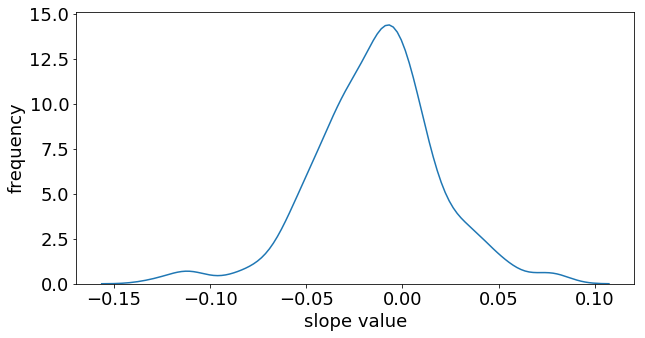

In [31]:
fig,ax = plt.subplots(figsize=(10,5))
ax = sns.distplot(z,hist=False)
ax.set(xlabel='slope value',ylabel='frequency')
plt.show()

In [35]:
len(z)

421